Single Particle Spin $\tfrac{1}{2}$ system: Pulse Shape as Input
====================================

Want to be able to represent a spin $\tfrac{1}{2}$ system so we can test the time evolution of different pulses. Our Hamiltonian can be controlled by a laser. A laser can be controlled by the intensity, frequency, and phase. While not exactly the same, these can be mapped to three parameters in our Hamiltonian:
$$
\text{intensity} \mapsto \Omega(t) \\
\text{frequency} \mapsto \Delta(t) \\
\text{phase} \mapsto \phi(t) 
$$
which appear in the Hamiltonian as follows:
$$
\hat{H}(\Delta(t), \Omega(t), \phi(t)) = \frac{-\Delta(t)}{2}\hat{1} 
    - \frac{-\Delta(t)}{2}\hat{\sigma}_z 
    + \frac{\Omega(t)}{2}
        (
            \cos{\phi(t)}\hat{\sigma}_x +
            \sin{\phi(t)}\hat{\sigma}_y
        )
    = -\frac{1}{2}\Delta(t)\hat{1} + \frac{1}{2}\tilde{\vec{\Omega}}(t) \cdot \hat{\vec{\sigma}}
$$

The `QuantumOptics` package has some of its own built in types that we will use. We also need to declare a basis we are working in. We will name these here:

In [1]:
using QuantumOptics
using LinearAlgebra

computational = SpinBasis(1//2)

I = identityoperator(computational)
σx = sigmax(computational)
σy = sigmay(computational)
σz = sigmaz(computational)
σ_vec = [σx, σy, σz];

down = spindown(computational)
up = spinup(computational)
;

The following scheme we will use is to require that the user provides the waveforms for $\Delta(t)$, $\Omega(t)$, and $\phi(t)$ and the total time $T$ they want the system to run for.  

We might also want to talk about the actual bloch sphere trajectory as the input, in which case we give the values $\theta(t)$, $\phi(t)$, and $|\tilde{\vec{\Omega}}(t)|$. 

In [2]:

function twoLevelSysFromParameters(Δ::Function, Ω::Function, ϕ::Function, T::Real; number_of_reported_times::Int = 100)
    
    H(t, ignored) = Ω(t)*σx/2 - Δ(t)*I/2 - Δ(t)*σz/2 

    tspan = range(0, T, number_of_reported_times)
    tout, psi_t = timeevolution.schroedinger_dynamic(tspan, down, H)
    return tout, psi_t, H
end

# TODO: add the twoLevelSysFromBlochAngles function!
# function twoLevelSysFromBlochAngles(Ω_eff_mag::Function, θ::Function, ϕ::Function, T::Float64; t::Float64 = 0.01)
#     Δ(t) = cos(θ(t))*Ω_eff_mag(t)
#     Ω(t) = -tan(θ(t))*Δ(t)
#     Ω_vec(t) = [Ω(t), Ω(t), -Δ(t)]

#     H(t, ignored) = Ω(t)*σx/2 - Δ(t)*I/2 - Δ(t)*σz/2 

#     tspan = [0.0:0.01:T;] 
#     tout, psi_t = timeevolution.schroedinger_dynamic(tspan, spindown(computational), H)
#     return tout, psi_t
# end


twoLevelSysFromParameters (generic function with 1 method)

Now we can look at a very simple example. 
$$
\Delta = \Omega \Rightarrow \theta = \pi/4
$$

In [3]:
include("./Plotting.jl")
include("./Utils.jl")
using CairoMakie
using IJulia

Δ(t) = -1
Ω(t) = 1
ϕ(t) = 0
T=π*0.8

filename = "./graphics/simple_bloch.gif"
tout, psi_t, H = twoLevelSysFromParameters(Δ, Ω, ϕ, T)
save_bloch_animation(tout, psi_t, 3, 24, filename)

display("text/html", """
<img src="$filename" width=600>
""")

Matt Chow gate from Vikas' Python code:
```python
def Matt(T,V):     # The three parameters are t_hold(<0.5), sigma(~0.15), delta_max (negative), 
    Oset = 2*np.pi* np.array([0.0, 0.412, 0.825, 1.237, 1.485, 1.485, 1.237, 0.825, 0.412, 0.0])*1.65
    Dset = 2*np.pi* np.array([4.08, 3.06, 2.04, 1.02, 0.408, 0.408, 1.02, 2.04, 3.06, 4.08])
    
    delta = CubicSpline(np.linspace(0,T,10),Dset)
    omega = CubicSpline(np.linspace(0,T,10),Oset)
    
    phi = 0

    ..."""rest of function"""...
```
we can recreate this in Julia now.

In [4]:
using Interpolations
using CairoMakie

function mattChow(T::Real)
    fudge_factor = 1.65 # this was not part of the original gate but is needed for the simulation to match the experimental data
    Ω_points = fudge_factor*2π .* [0.0, 0.412, 0.825, 1.237, 1.485, 1.485, 1.237, 0.825, 0.412, 0.0]
    # Ω_points = 2π .* [0.0, 0.412, 0.825, 1.237, 1.485, 1.485, 1.237, 0.825, 0.412, 0.0]
    Δ_points = 2π .* [4.08, 3.06, 2.04, 1.02, 0.408, 0.408, 1.02, 2.04, 3.06, 4.08]

    ts = range(0, T, length(Ω_points))
    Ω(t) = cubic_spline_interpolation(ts, Ω_points)(t) # this could also be `Ω = cubic_spline_interpolation(ts, Ω_points)` ¯\_(ツ)_/¯
    Δ(t) = cubic_spline_interpolation(ts, Δ_points)(t)
    ϕ(t) = 0

    (tout, psi_t, H) = twoLevelSysFromParameters(Δ, Ω, ϕ, T)
    return (tout, psi_t, H), (Δ, Ω, ϕ) # returns a lot of stuff but they are all useful
end


mattChow (generic function with 1 method)

Now we can run it and see what happens when we stretch this gate to longer times than it was meant for. We are not making it a valid $CZ$ gate, just looking at what happens to the population.

Iteration 1
Iteration 2
Iteration 3
Iteration 4
Iteration 5
Iteration 6
Iteration 7
Iteration 8
Iteration 9
Iteration 10


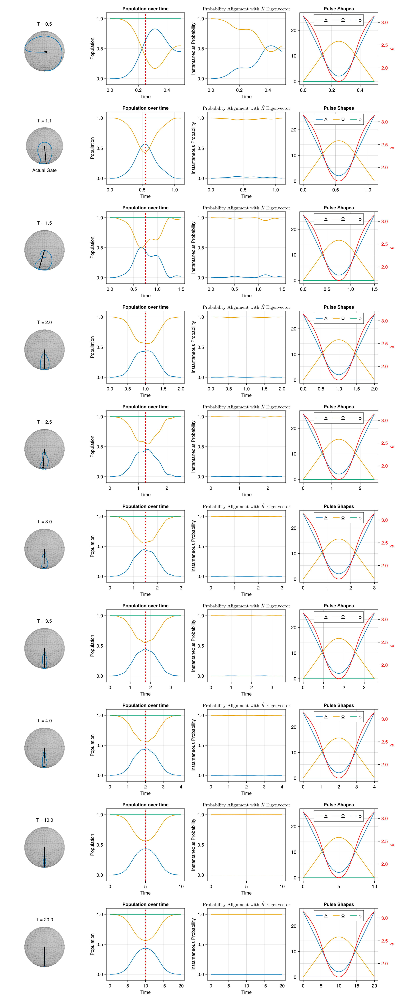

CairoMakie.Screen{IMAGE}


In [5]:
using CairoMakie

times = [0.5, 1.1, 1.5, 2, 2.5, 3, 3.5, 4, 10, 20]
iterations = length(times)
fig = Figure(size = (1200, 300*iterations))
for (i,T) in enumerate(times)
    (tout, psi_t, H), (Δ, Ω, ϕ) = mattChow(T)
    bloch = bloch_plot!(fig[i,1], tout, psi_t, title="T = $(round(T, digits=3))")
    if T == 1.1
        text!(bloch, 0, 0,-1.5, text="Actual Gate", align = (0.5, 0))
    end
    update_cam!(bloch.scene, Vec3f(2, 0, 0), Vec3f(0, 0, 0))
    
    pop_ax = population_plot!(fig[i, 2], tout, psi_t)
    vlines!(fig[i, 2], [T/2], linestyle=:dash, color=:red)

    alignment_plot!(fig[i, 3], tout, psi_t, (t -> H(t, nothing)))

    ax_pulse = Axis(fig[i, 4], title="Pulse Shapes")
    lines!(ax_pulse, tout, Δ, label="Δ")
    lines!(ax_pulse, tout, Ω, label="Ω")
    lines!(ax_pulse, tout, ϕ, label="ϕ")
    axislegend(ax_pulse, position = :ct, orientation = :horizontal)
    ax_θ = Axis(fig[i, 4], ylabelcolor = :red, ylabel="θ", yaxisposition= :right, yticklabelcolor=:red)
    lines!(ax_θ, tout, (t -> atan(Ω(t), -Δ(t))), color = :red)

    println("Iteration $i")
end
display(fig)

These plots help with some intuition but really we want to know how good we can do as we scan over all the possible gate times.

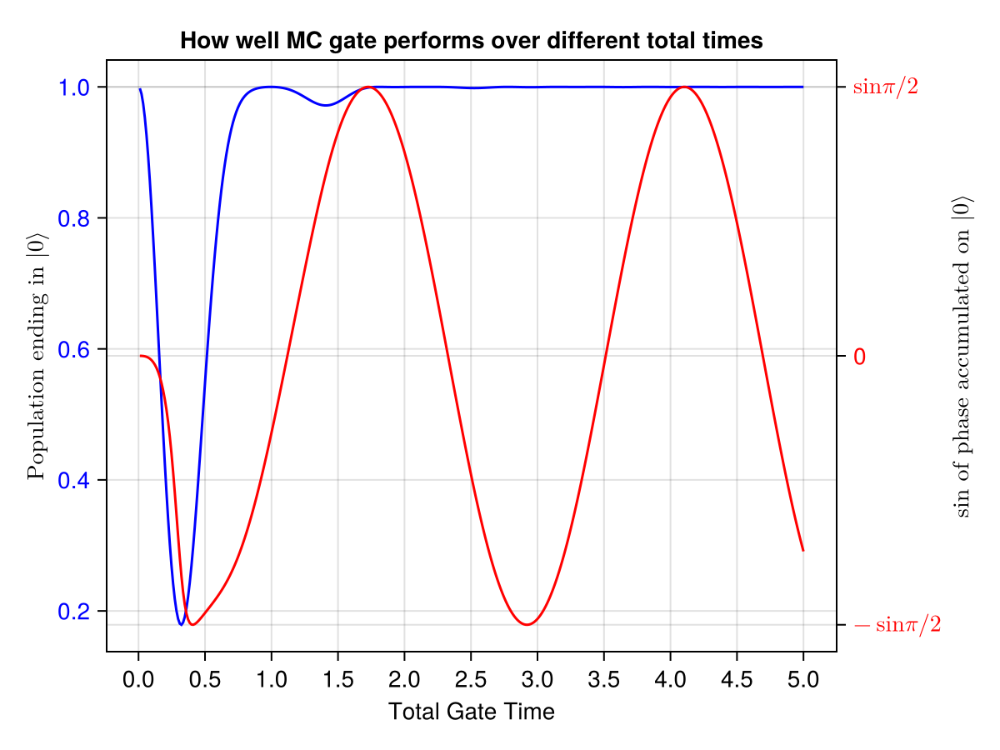

CairoMakie.Screen{IMAGE}


In [6]:
using QuantumOptics

iterations = 400
tmin = 0.01
tmax = 5
Ts = range(tmin, tmax, iterations)

function ending_population(T::Real) 
    (tout, psi_t, H), (Δ, Ω, ϕ) = mattChow(T)
    return abs2(psi_t[end][2])
end

function ending_phase(T::Real) 
    (tout, psi_t, H), (Δ, Ω, ϕ) = mattChow(T)
    return angle(psi_t[end][2])
end

# plotting
fig = Figure()
ax1 = Axis(fig[1, 1], yticklabelcolor = :blue,

    title = "How well MC gate performs over different total times",
    xlabel = "Total Gate Time",
    ylabel = L"Population ending in $|0\rangle$",
    xticks = (0:0.5:tmax)
)
ax2 = Axis(fig[1, 1], yticklabelcolor = :red, yaxisposition = :right,
    # yticks = sin.([-1, 0, 1]), ["-π", "-π/2", "0", "π/2", "π"]
    yticks = (sin.([-π/2, 0, π/2]), [L"$-\sin \pi/2$", "0", L"$\sin \pi/2$",]),
    ylabel = L"$\sin$ of phase accumulated on $|0\rangle$",
)

hidespines!(ax2)
hidexdecorations!(ax2)

lines!(ax1, Ts, ending_population, color = :blue)
lines!(ax2, Ts, x -> sin.(ending_phase(x)), color = :red)
display(fig)

Now lets explore how different pulse shapes with the same basic symmetry look. We want to know *why* this gate seems to return commonly to the ground state.

Iteration 1
Iteration 2
Iteration 3
Iteration 4
Iteration 5
Iteration 6
Iteration 7
Iteration 8
Iteration 9
Iteration 10


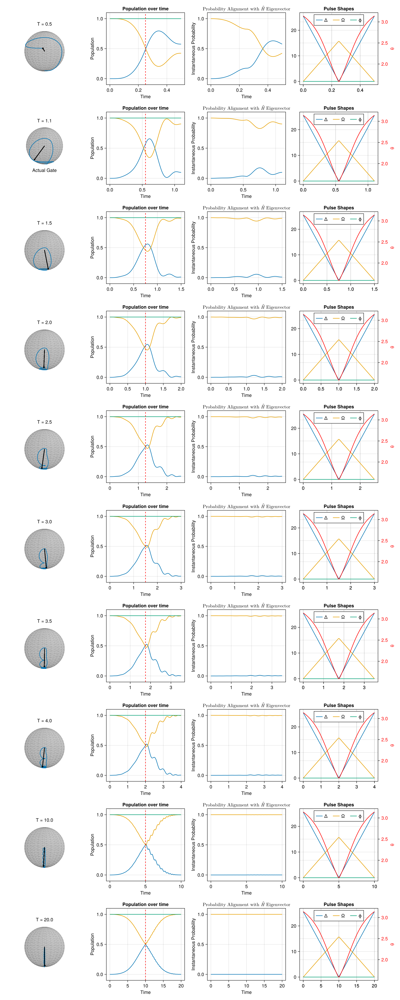

Iteration 1
Iteration 2
Iteration 3
Iteration 4
Iteration 5
Iteration 6
Iteration 7
Iteration 8
Iteration 9
Iteration 10


In [ ]:
using Interpolations
using QuantumOptics
using CairoMakie

function linear_Δ(t, T) 
    b_Δ = 25.6
    h_Δ = -25.6
    m_Δ=2*h_Δ/T
    return t<T/2 ? m_Δ*t+b_Δ : -m_Δ*(t-T)+b_Δ 
end

function quadratic_Δ(t, T)
    b_Δ = 25.6
    h_Δ = -25.6
    m_Δ=2*h_Δ/T
    return -(m_Δ^2/h_Δ)*t^2+2*m_Δ*t+b_Δ 
end


function linear_Ω(t, T)
    b_Ω = 0
    h_Ω = 15.8
    m_Ω=2*h_Ω/T
    return t<T/2 ? m_Ω*t+b_Ω : -m_Ω*(t-T)+b_Ω 
end
function quadratic_Ω(t, T)
    b_Ω = 0
    h_Ω = 15.8
    m_Ω=2*h_Ω/T
    b_Ω = 0
    h_Ω = 15.8
    m_Ω=2*h_Ω/T
    return -(m_Ω^2/h_Ω)*t^2+2*m_Ω*t+b_Ω 
end

times = [0.5, 1.1, 1.5, 2, 2.5, 3, 3.5, 4, 10, 20]
iterations = length(times)
for (Δ_, Ω_) in [(linear_Δ, linear_Ω), (quadratic_Δ, quadratic_Ω)]
    fig = Figure(size = (1200, 300*iterations))
    for (i,T) in enumerate(times)
        Δ(t) = Δ_(t, T)
        Ω(t) = Ω_(t, T)
        (tout, psi_t, H) = twoLevelSysFromParameters(Δ, Ω, (t->0), T)
        bloch = bloch_plot!(fig[i,1], tout, psi_t, title="T = $(round(T, digits=3))")
        if T == 1.1
            text!(bloch, 0, 0,-1.5, text="Actual Gate", align = (0.5, 0))
        end
        update_cam!(bloch.scene, Vec3f(2, 0, 0), Vec3f(0, 0, 0))
        
        pop_ax = population_plot!(fig[i, 2], tout, psi_t)
        vlines!(fig[i, 2], [T/2], linestyle=:dash, color=:red)

        alignment_plot!(fig[i, 3], tout, psi_t, (t -> H(t, nothing)))

        ax_pulse = Axis(fig[i, 4], title="Pulse Shapes")
        lines!(ax_pulse, tout, Δ, label="Δ")
        lines!(ax_pulse, tout, Ω, label="Ω")
        lines!(ax_pulse, tout, ϕ, label="ϕ")
        axislegend(ax_pulse, position = :ct, orientation = :horizontal)
        ax_θ = Axis(fig[i, 4], ylabelcolor = :red, ylabel="θ", yaxisposition= :right, yticklabelcolor=:red)
        lines!(ax_θ, tout, (t -> atan(Ω(t), -Δ(t))), color = :red)

        println("Iteration $i")
    end
    display(fig)
end

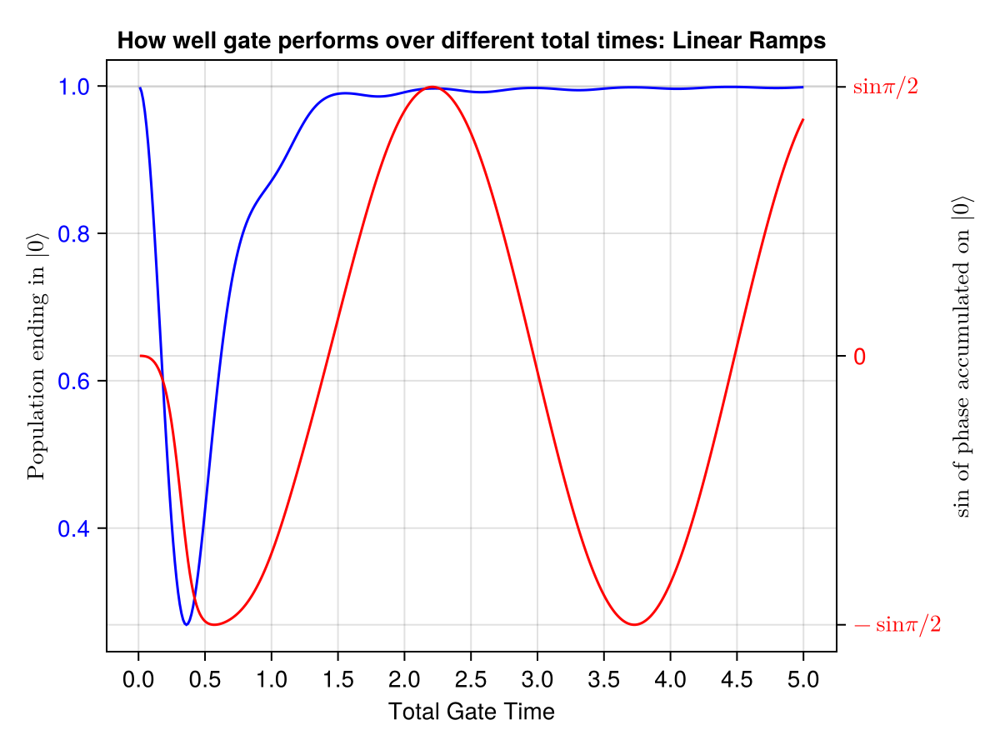

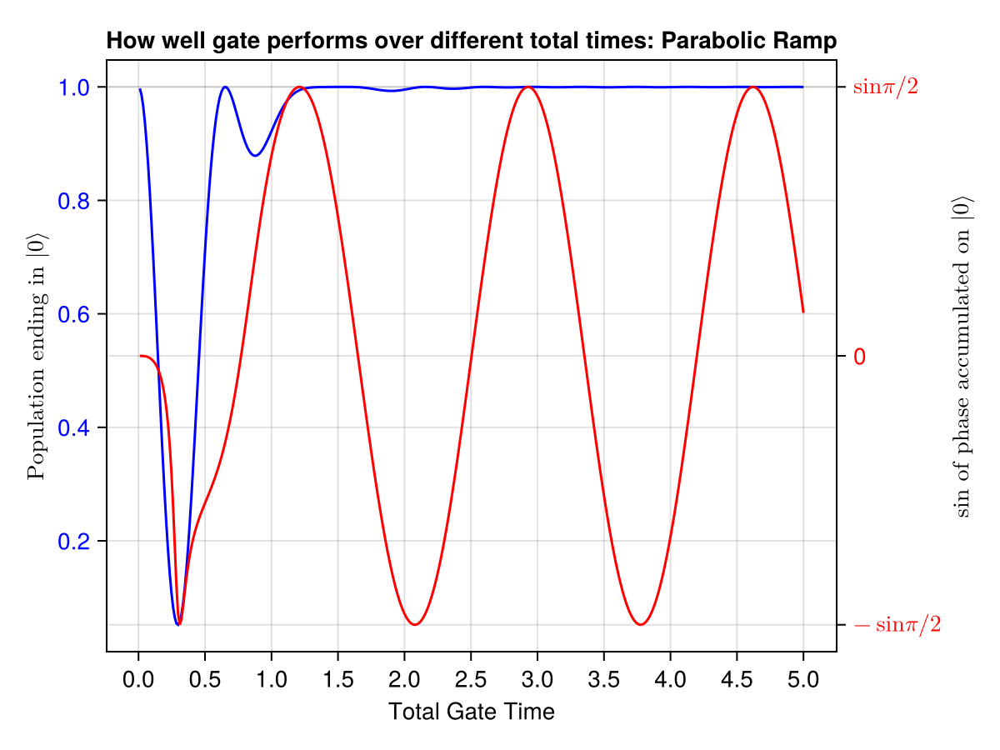

In [ ]:
for (Δ_, Ω_, name) in [(linear_Δ, linear_Ω, "Linear Ramps"), (quadratic_Δ, quadratic_Ω, "Parabolic Ramp")]

    iterations = 400
    tmin = 0.01
    tmax = 5
    Ts = range(tmin, tmax, iterations)

    function ending_population(T::Real) 
        Δ(t) = Δ_(t, T)
        Ω(t) = Ω_(t, T)
        (tout, psi_t, H) = twoLevelSysFromParameters(Δ, Ω, (t->0), T)
        return abs2(psi_t[end][2])
    end

    function ending_phase(T::Real)     
        Δ(t) = Δ_(t, T)
        Ω(t) = Ω_(t, T)    
        (tout, psi_t, H) = twoLevelSysFromParameters(Δ, Ω, (t->0), T)
        return angle(psi_t[end][2])
    end

    # plotting
    fig = Figure()
    ax1 = Axis(fig[1, 1], yticklabelcolor = :blue,

        title = "How well gate performs over different total times: $name",
        xlabel = "Total Gate Time",
        ylabel = L"Population ending in $|0\rangle$",
        xticks = (0:0.5:tmax)
    )
    ax2 = Axis(fig[1, 1], yticklabelcolor = :red, yaxisposition = :right,
        # yticks = sin.([-1, 0, 1]), ["-π", "-π/2", "0", "π/2", "π"]
        yticks = (sin.([-π/2, 0, π/2]), [L"$-\sin \pi/2$", "0", L"$\sin \pi/2$",]),
        ylabel = L"$\sin$ of phase accumulated on $|0\rangle$",
    )

    hidespines!(ax2)
    hidexdecorations!(ax2)

    lines!(ax1, Ts, ending_population, color = :blue)
    lines!(ax2, Ts, x -> sin.(ending_phase(x)), color = :red)
    display(fig)
end